# Model 2

- batchsize 32, 
- 300 epoch



In [1]:
import tensorflow as tf
from tensorflow import keras
from keras.preprocessing.image import ImageDataGenerator, img_to_array, load_img
from keras.layers import Conv2D, UpSampling2D
from keras import Sequential
from skimage.color import rgb2lab, lab2rgb
from skimage.transform import resize
from skimage.io import imsave
import numpy as np


path = r"./input"

train_datagen = ImageDataGenerator(rescale=1. / 255,
                                  )

train = train_datagen.flow_from_directory(path, 
                                          target_size=(256, 256), 
                                          batch_size=32, 
                                          class_mode=None)




Found 710 images belonging to 1 classes.


Convert from RGB to Lab

In [2]:
X =[]
Y =[]
for img in train[0]:
  try:
      lab = rgb2lab(img)
      X.append(lab[:,:,0]) 
      Y.append(lab[:,:,1:] / 128) 
  except:
     print('error')
X = np.array(X)
Y = np.array(Y)
X = X.reshape(X.shape+(1,)) 
print(X.shape)
print(Y.shape)

(32, 256, 256, 1)
(32, 256, 256, 2)


In [6]:

#Encoder
model1 = Sequential()
model1.add(Conv2D(64, (3, 3), activation='relu', padding='same', strides=2, input_shape=(256, 256, 1)))
model1.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model1.add(Conv2D(128, (3,3), activation='relu', padding='same', strides=2))
model1.add(Conv2D(256, (3,3), activation='relu', padding='same', strides=2))
model1.add(Conv2D(256, (3,3), activation='relu', padding='same'))

#Decoder
model1.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model1.add(UpSampling2D((2, 2)))
model1.add(Conv2D(64, (3,3), activation='relu', padding='same'))
model1.add(UpSampling2D((2, 2)))
model1.add(Conv2D(2, (3, 3), activation='tanh', padding='same'))
model1.add(UpSampling2D((2, 2)))

In [7]:
model1.compile(optimizer='adam', loss='mse' , metrics=['accuracy'])
model1.summary()


Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_29 (Conv2D)          (None, 128, 128, 64)      640       
                                                                 
 conv2d_30 (Conv2D)          (None, 128, 128, 128)     73856     
                                                                 
 conv2d_31 (Conv2D)          (None, 64, 64, 128)       147584    
                                                                 
 conv2d_32 (Conv2D)          (None, 32, 32, 256)       295168    
                                                                 
 conv2d_33 (Conv2D)          (None, 32, 32, 256)       590080    
                                                                 
 conv2d_34 (Conv2D)          (None, 32, 32, 128)       295040    
                                                                 
 up_sampling2d_9 (UpSamplin  (None, 64, 64, 128)     

In [8]:
keras.utils.plot_model(model1, to_file='model1.png',show_shapes=True, show_layer_names=True)

You must install pydot (`pip install pydot`) and install graphviz (see instructions at https://graphviz.gitlab.io/download/) for plot_model to work.


In [14]:
history = keras.callbacks.History()
model1.fit(X,Y,validation_split=0.2, epochs=300, batch_size=32,callbacks=[history])


Epoch 1/300


1/1 [==============================] - 8s 8s/step - loss: 0.1979 - accuracy: 0.5197 - val_loss: 0.9655 - val_accuracy: 0.4382
Epoch 2/300
1/1 [==============================] - 3s 3s/step - loss: 1.0636 - accuracy: 0.4353 - val_loss: 0.9660 - val_accuracy: 0.4374
Epoch 3/300
1/1 [==============================] - 3s 3s/step - loss: 1.0682 - accuracy: 0.4355 - val_loss: 0.9661 - val_accuracy: 0.4374
Epoch 4/300
1/1 [==============================] - 3s 3s/step - loss: 1.0698 - accuracy: 0.4356 - val_loss: 0.9660 - val_accuracy: 0.4374
Epoch 5/300
1/1 [==============================] - 3s 3s/step - loss: 1.0706 - accuracy: 0.4356 - val_loss: 0.9660 - val_accuracy: 0.4374
Epoch 6/300
1/1 [==============================] - 3s 3s/step - loss: 1.0705 - accuracy: 0.4356 - val_loss: 0.9658 - val_accuracy: 0.4374
Epoch 7/300
1/1 [==============================] - 3s 3s/step - loss: 1.0697 - accuracy: 0.4356 - val_loss: 0.9693 - val_accuracy: 0.4374
Epoch 8/300
1/1 [===============

1/1 [==============================] - 3s 3s/step - loss: 0.0252 - accuracy: 0.5656 - val_loss: 0.0245 - val_accuracy: 0.4827
Epoch 57/300
1/1 [==============================] - 3s 3s/step - loss: 0.0262 - accuracy: 0.5185 - val_loss: 0.0248 - val_accuracy: 0.5598
Epoch 58/300
1/1 [==============================] - 3s 3s/step - loss: 0.0252 - accuracy: 0.5735 - val_loss: 0.0274 - val_accuracy: 0.5633
Epoch 59/300
1/1 [==============================] - 3s 3s/step - loss: 0.0258 - accuracy: 0.5720 - val_loss: 0.0270 - val_accuracy: 0.5577
Epoch 60/300
1/1 [==============================] - 3s 3s/step - loss: 0.0250 - accuracy: 0.5717 - val_loss: 0.0269 - val_accuracy: 0.4908
Epoch 61/300
1/1 [==============================] - 3s 3s/step - loss: 0.0256 - accuracy: 0.5212 - val_loss: 0.0266 - val_accuracy: 0.5238
Epoch 62/300
1/1 [==============================] - 3s 3s/step - loss: 0.0250 - accuracy: 0.5783 - val_loss: 0.0270 - val_accuracy: 0.5632
Epoch 63/300
1/1 [======================

Epoch 115/300
1/1 [==============================] - 3s 3s/step - loss: 0.0220 - accuracy: 0.6871 - val_loss: 0.0233 - val_accuracy: 0.6213
Epoch 116/300
1/1 [==============================] - 3s 3s/step - loss: 0.0218 - accuracy: 0.6597 - val_loss: 0.0237 - val_accuracy: 0.5666
Epoch 117/300
1/1 [==============================] - 3s 3s/step - loss: 0.0221 - accuracy: 0.6214 - val_loss: 0.0215 - val_accuracy: 0.6656
Epoch 118/300
1/1 [==============================] - 3s 3s/step - loss: 0.0215 - accuracy: 0.6803 - val_loss: 0.0208 - val_accuracy: 0.6962
Epoch 119/300
1/1 [==============================] - 3s 3s/step - loss: 0.0217 - accuracy: 0.6902 - val_loss: 0.0212 - val_accuracy: 0.6788
Epoch 120/300
1/1 [==============================] - 3s 3s/step - loss: 0.0212 - accuracy: 0.6879 - val_loss: 0.0250 - val_accuracy: 0.6357
Epoch 121/300
1/1 [==============================] - 3s 3s/step - loss: 0.0219 - accuracy: 0.6604 - val_loss: 0.0209 - val_accuracy: 0.7000
Epoch 122/300
1/1 [=

1/1 [==============================] - 3s 3s/step - loss: 0.0202 - accuracy: 0.6997 - val_loss: 0.0196 - val_accuracy: 0.6998
Epoch 174/300
1/1 [==============================] - 3s 3s/step - loss: 0.0209 - accuracy: 0.7129 - val_loss: 0.0211 - val_accuracy: 0.6711
Epoch 175/300
1/1 [==============================] - 3s 3s/step - loss: 0.0200 - accuracy: 0.7125 - val_loss: 0.0225 - val_accuracy: 0.6322
Epoch 176/300
1/1 [==============================] - 3s 3s/step - loss: 0.0203 - accuracy: 0.6896 - val_loss: 0.0199 - val_accuracy: 0.6958
Epoch 177/300
1/1 [==============================] - 3s 3s/step - loss: 0.0213 - accuracy: 0.7096 - val_loss: 0.0200 - val_accuracy: 0.6900
Epoch 178/300
1/1 [==============================] - 3s 3s/step - loss: 0.0209 - accuracy: 0.7069 - val_loss: 0.0215 - val_accuracy: 0.6579
Epoch 179/300
1/1 [==============================] - 3s 3s/step - loss: 0.0202 - accuracy: 0.7086 - val_loss: 0.0224 - val_accuracy: 0.6428
Epoch 180/300
1/1 [===============

1/1 [==============================] - 3s 3s/step - loss: 0.0168 - accuracy: 0.7326 - val_loss: 0.0204 - val_accuracy: 0.6501
Epoch 232/300
1/1 [==============================] - 3s 3s/step - loss: 0.0167 - accuracy: 0.7347 - val_loss: 0.0193 - val_accuracy: 0.6462
Epoch 233/300
1/1 [==============================] - 3s 3s/step - loss: 0.0167 - accuracy: 0.7336 - val_loss: 0.0196 - val_accuracy: 0.6666
Epoch 234/300
1/1 [==============================] - 3s 3s/step - loss: 0.0166 - accuracy: 0.7367 - val_loss: 0.0192 - val_accuracy: 0.6610
Epoch 235/300
1/1 [==============================] - 3s 3s/step - loss: 0.0165 - accuracy: 0.7377 - val_loss: 0.0203 - val_accuracy: 0.6362
Epoch 236/300
1/1 [==============================] - 3s 3s/step - loss: 0.0164 - accuracy: 0.7378 - val_loss: 0.0194 - val_accuracy: 0.6550
Epoch 237/300
1/1 [==============================] - 3s 3s/step - loss: 0.0163 - accuracy: 0.7400 - val_loss: 0.0193 - val_accuracy: 0.6747
Epoch 238/300
1/1 [===============

1/1 [==============================] - 3s 3s/step - loss: 0.0165 - accuracy: 0.7221 - val_loss: 0.0180 - val_accuracy: 0.6822
Epoch 290/300
1/1 [==============================] - 3s 3s/step - loss: 0.0158 - accuracy: 0.7419 - val_loss: 0.0178 - val_accuracy: 0.6613
Epoch 291/300
1/1 [==============================] - 3s 3s/step - loss: 0.0158 - accuracy: 0.7423 - val_loss: 0.0206 - val_accuracy: 0.6100
Epoch 292/300
1/1 [==============================] - 3s 3s/step - loss: 0.0154 - accuracy: 0.7332 - val_loss: 0.0228 - val_accuracy: 0.6139
Epoch 293/300
1/1 [==============================] - 3s 3s/step - loss: 0.0155 - accuracy: 0.7380 - val_loss: 0.0202 - val_accuracy: 0.6314
Epoch 294/300
1/1 [==============================] - 3s 3s/step - loss: 0.0155 - accuracy: 0.7458 - val_loss: 0.0174 - val_accuracy: 0.6911
Epoch 295/300
1/1 [==============================] - 3s 3s/step - loss: 0.0157 - accuracy: 0.7486 - val_loss: 0.0188 - val_accuracy: 0.6755
Epoch 296/300
1/1 [===============

In [15]:
sample_image = np.expand_dims(X[0],axis=0)

1/1 [==============================] - 0s 160ms/step


1/1 [==============================] - 0s 122ms/step


1/1 [==============================] - 0s 135ms/step


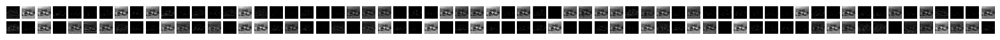

1/1 [==============================] - 0s 148ms/step


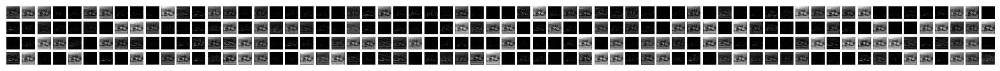

1/1 [==============================] - 0s 185ms/step


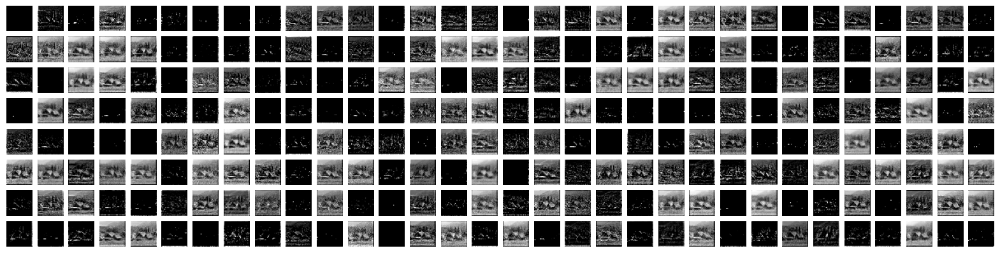

1/1 [==============================] - 0s 203ms/step


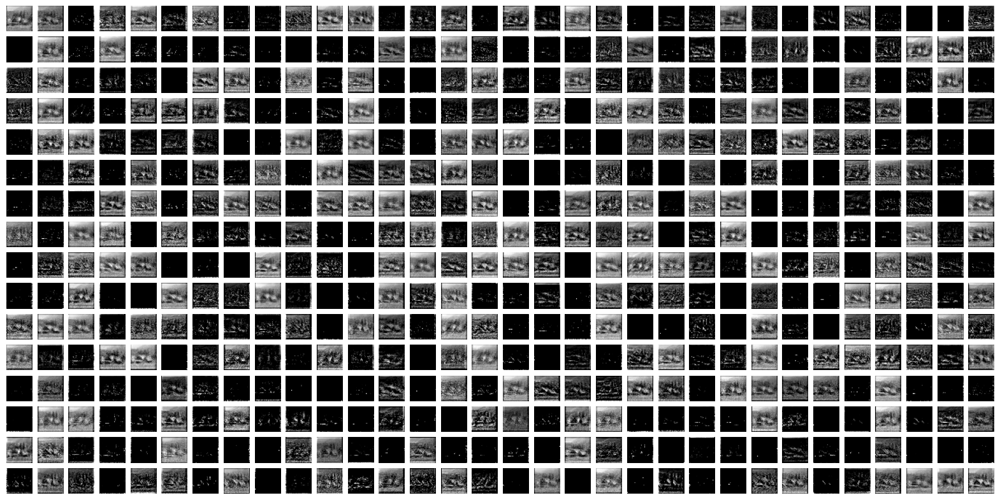

1/1 [==============================] - 0s 240ms/step


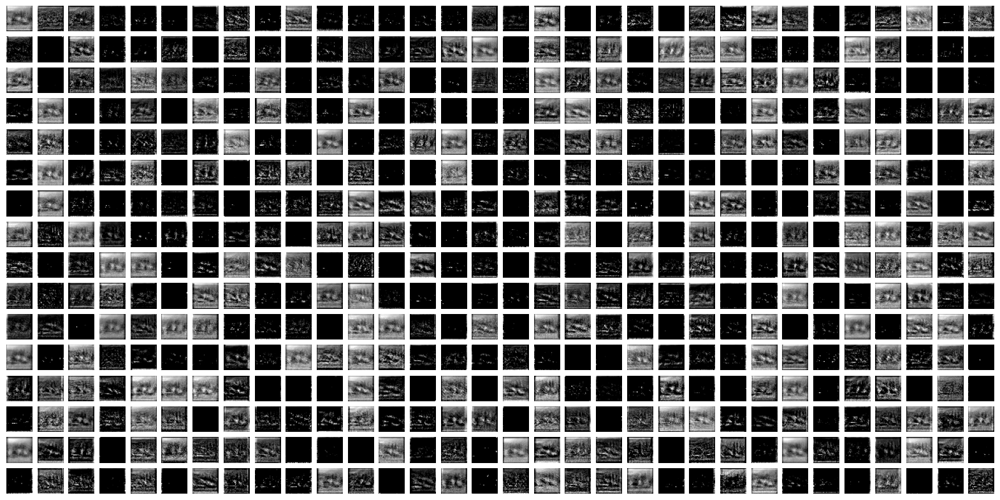

1/1 [==============================] - 0s 257ms/step


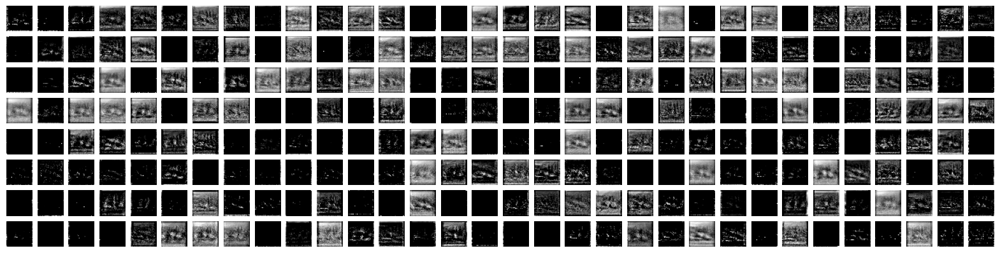

1/1 [==============================] - 0s 281ms/step


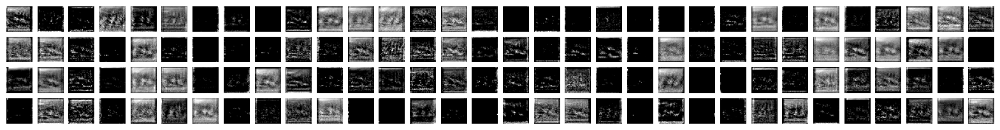

1/1 [==============================] - 0s 284ms/step


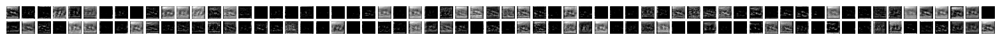

1/1 [==============================] - 0s 311ms/step


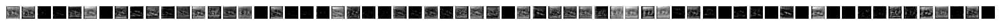

1/1 [==============================] - 0s 321ms/step


1/1 [==============================] - 0s 368ms/step


1/1 [==============================] - 0s 353ms/step


1/1 [==============================] - 0s 383ms/step


1/1 [==============================] - 0s 396ms/step


In [12]:
from keras.models import Model
import matplotlib.pyplot as plt
import numpy as np

input_image = sample_image

layer_outputs = [layer.output for layer in model.layers]
feature_map_models = [Model(inputs=model.inputs, outputs=output) for output in layer_outputs]

for feature_map_model in feature_map_models:
    feature_map = feature_map_model.predict(input_image)
    
    n_features = feature_map.shape[-1]  
    size = feature_map.shape[1]  
    plt.figure(figsize=(20, 20))
    for i in range(1, n_features + 1):
        plt.subplot(size, size, i)
        plt.imshow(feature_map[0, :, :, i - 1], cmap='gray')
        plt.axis('off')

    plt.show()


[]

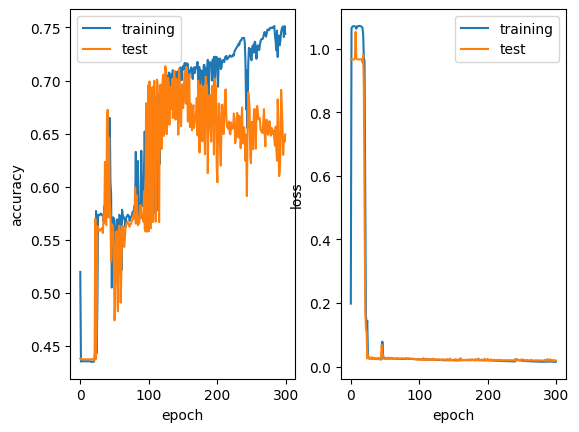

In [16]:
plt.subplot(121)
plt.plot(history.history['accuracy'],label='training')
plt.plot(history.history['val_accuracy'],label = 'test')
plt.legend()
plt.xlabel("epoch")
plt.ylabel("accuracy")
plt.subplot(122)
plt.plot(history.history['loss'],label='training')
plt.plot(history.history['val_loss'],label = 'test')
plt.legend()
plt.xlabel("epoch")
plt.ylabel("loss")
plt.plot()

## Test result

Download test images

1/1 [==============================] - 0s 293ms/step


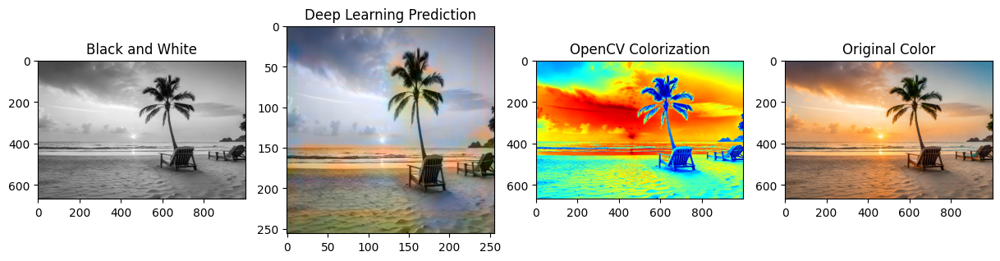

1/1 [==============================] - 0s 68ms/step


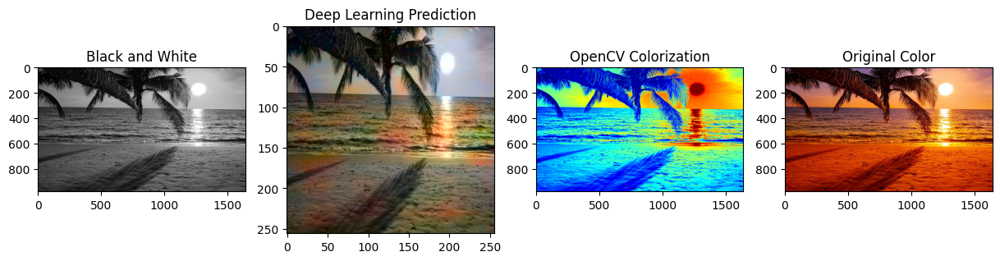

1/1 [==============================] - 0s 62ms/step


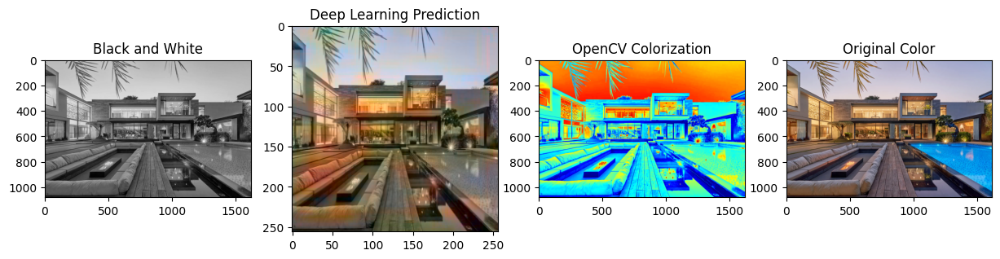

1/1 [==============================] - 0s 65ms/step


C:\Users\win10\AppData\Local\Temp\ipykernel_5996\1876879985.py:56: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 43 negative Z values that have been clipped to zero
  axarr[1].imshow(lab2rgb(result))


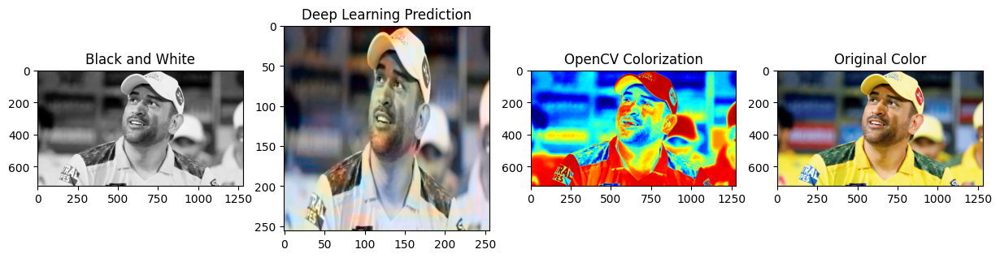

1/1 [==============================] - 0s 69ms/step


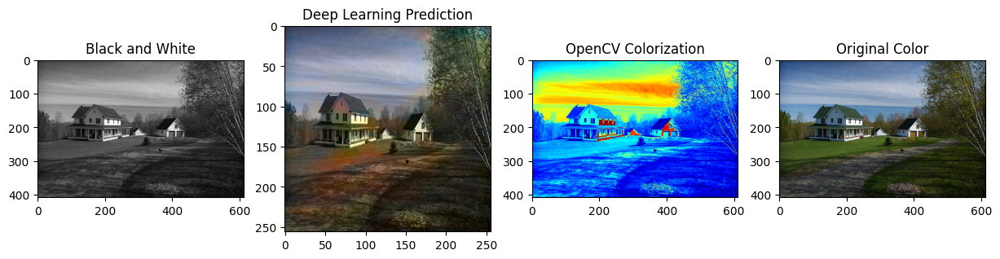

In [18]:
from PIL import Image
import os
import numpy as np
import cv2
from tensorflow.keras.preprocessing.image import img_to_array
from skimage.color import rgb2lab, lab2rgb
from skimage.transform import resize
import matplotlib.pyplot as plt

# Paths to your 'gray' and 'rgb' folders
gray_images_path = 'ne_images/ne_images/gray/'
rgb_images_path = 'ne_images/ne_images/rgb/'

# List all files in the 'gray' folder
gray_image_files = os.listdir(gray_images_path)

for file_name in gray_image_files:
    if file_name.endswith(('.jpg', '.jpeg', '.png')):  # Check for image files
        gray_file_path = os.path.join(gray_images_path, file_name)
        rgb_file_path = os.path.join(rgb_images_path, file_name)

        # Load the grayscale image and convert it for the model
        img_gray = Image.open(gray_file_path).convert('RGB')
        img1_color = []
        img1 = img_to_array(img_gray)
        img1 = resize(img1, (256, 256))
        img1_color.append(img1)

        img1_color = np.array(img1_color, dtype=float)
        img1_color = rgb2lab(1.0 / 255 * img1_color)[:, :, :, 0]
        img1_color = img1_color.reshape(img1_color.shape + (1,))

        # Predict the colorization with the deep learning model
        output1 = model1.predict(img1_color)
        output1 = output1 * 128

        # Construct the colorized image from the model
        result = np.zeros((256, 256, 3))
        result[:, :, 0] = img1_color[0][:, :, 0]
        result[:, :, 1:] = output1[0]

        # Load the original color image
        img_original = Image.open(rgb_file_path)

        # Colorization with OpenCV using colormap
        img_gray_cv = cv2.imread(gray_file_path, cv2.IMREAD_GRAYSCALE)
        colorized_img_opencv = cv2.applyColorMap(img_gray_cv, cv2.COLORMAP_JET)

        # Display the grayscale, model prediction, OpenCV colorization, and original images
        f, axarr = plt.subplots(1, 4, figsize=(15, 5))
        axarr[0].title.set_text('Black and White')
        axarr[1].title.set_text('Deep Learning Prediction')
        axarr[2].title.set_text('OpenCV Colorization')
        axarr[3].title.set_text('Original Color')
        axarr[0].imshow(img_gray.convert('L'), cmap='gray')
        axarr[1].imshow(lab2rgb(result))
        axarr[2].imshow(cv2.cvtColor(colorized_img_opencv, cv2.COLOR_BGR2RGB))
        axarr[3].imshow(img_original)
        plt.show()


In [19]:
from keras.layers import Dropout

#Encoder
model3 = Sequential()
model3.add(Conv2D(64, (3, 3), activation='relu', padding='same', strides=2, input_shape=(256, 256, 1)))
model3.add(Conv2D(128, (3, 3), activation='relu', padding='same'))
model3.add(Dropout(0.3))
model3.add(Conv2D(128, (3,3), activation='relu', padding='same', strides=2))
model3.add(Dropout(0.3))
model3.add(Conv2D(256, (3,3), activation='relu', padding='same', strides=2))
model3.add(Conv2D(256, (3,3), activation='relu', padding='same'))

#Decoder
model3.add(Conv2D(128, (3,3), activation='relu', padding='same'))
model3.add(Dropout(0.3))
model3.add(UpSampling2D((2, 2)))
model3.add(Conv2D(64, (3,3), activation='relu', padding='same'))
model3.add(Dropout(0.3))
model3.add(UpSampling2D((2, 2)))
model3.add(Conv2D(2, (3, 3), activation='tanh', padding='same'))
model3.add(UpSampling2D((2, 2)))

In [20]:
model3.compile(optimizer='adam', loss='mse' , metrics=['accuracy'])
model3.summary()

Model: "sequential_4"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 conv2d_37 (Conv2D)          (None, 128, 128, 64)      640       
                                                                 
 conv2d_38 (Conv2D)          (None, 128, 128, 128)     73856     
                                                                 
 dropout (Dropout)           (None, 128, 128, 128)     0         
                                                                 
 conv2d_39 (Conv2D)          (None, 64, 64, 128)       147584    
                                                                 
 dropout_1 (Dropout)         (None, 64, 64, 128)       0         
                                                                 
 conv2d_40 (Conv2D)          (None, 32, 32, 256)       295168    
                                                                 
 conv2d_41 (Conv2D)          (None, 32, 32, 256)      

In [21]:
history = keras.callbacks.History()
model1.fit(X,Y,validation_split=0.2, epochs=300, batch_size=32,callbacks=[history])


Epoch 1/300
1/1 [==============================] - 3s 3s/step - loss: 0.0144 - accuracy: 0.7486 - val_loss: 0.0179 - val_accuracy: 0.6446
Epoch 2/300
1/1 [==============================] - 3s 3s/step - loss: 0.0144 - accuracy: 0.7526 - val_loss: 0.0189 - val_accuracy: 0.6191
Epoch 3/300
1/1 [==============================] - 3s 3s/step - loss: 0.0142 - accuracy: 0.7498 - val_loss: 0.0200 - val_accuracy: 0.6247
Epoch 4/300
1/1 [==============================] - 3s 3s/step - loss: 0.0141 - accuracy: 0.7502 - val_loss: 0.0179 - val_accuracy: 0.6603
Epoch 5/300
1/1 [==============================] - 3s 3s/step - loss: 0.0138 - accuracy: 0.7558 - val_loss: 0.0175 - val_accuracy: 0.6705
Epoch 6/300
1/1 [==============================] - 3s 3s/step - loss: 0.0139 - accuracy: 0.7561 - val_loss: 0.0185 - val_accuracy: 0.6367
Epoch 7/300
1/1 [==============================] - 3s 3s/step - loss: 0.0136 - accuracy: 0.7585 - val_loss: 0.0198 - val_accuracy: 0.6236
Epoch 8/300
1/1 [=================

1/1 [==============================] - 3s 3s/step - loss: 0.0103 - accuracy: 0.7843 - val_loss: 0.0189 - val_accuracy: 0.6221
Epoch 61/300
1/1 [==============================] - 3s 3s/step - loss: 0.0102 - accuracy: 0.7831 - val_loss: 0.0183 - val_accuracy: 0.6197
Epoch 62/300
1/1 [==============================] - 3s 3s/step - loss: 0.0102 - accuracy: 0.7847 - val_loss: 0.0185 - val_accuracy: 0.6175
Epoch 63/300
1/1 [==============================] - 3s 3s/step - loss: 0.0101 - accuracy: 0.7866 - val_loss: 0.0187 - val_accuracy: 0.6206
Epoch 64/300
1/1 [==============================] - 3s 3s/step - loss: 0.0101 - accuracy: 0.7888 - val_loss: 0.0197 - val_accuracy: 0.6253
Epoch 65/300
1/1 [==============================] - 3s 3s/step - loss: 0.0103 - accuracy: 0.7749 - val_loss: 0.0180 - val_accuracy: 0.6363
Epoch 66/300
1/1 [==============================] - 3s 3s/step - loss: 0.0114 - accuracy: 0.7643 - val_loss: 0.0208 - val_accuracy: 0.6203
Epoch 67/300
1/1 [======================

Epoch 119/300
1/1 [==============================] - 3s 3s/step - loss: 0.0096 - accuracy: 0.7892 - val_loss: 0.0215 - val_accuracy: 0.6026
Epoch 120/300
1/1 [==============================] - 3s 3s/step - loss: 0.0099 - accuracy: 0.7811 - val_loss: 0.0193 - val_accuracy: 0.6154
Epoch 121/300
1/1 [==============================] - 3s 3s/step - loss: 0.0099 - accuracy: 0.7826 - val_loss: 0.0191 - val_accuracy: 0.6276
Epoch 122/300
1/1 [==============================] - 3s 3s/step - loss: 0.0094 - accuracy: 0.7901 - val_loss: 0.0203 - val_accuracy: 0.6317
Epoch 123/300
1/1 [==============================] - 3s 3s/step - loss: 0.0097 - accuracy: 0.7841 - val_loss: 0.0183 - val_accuracy: 0.6290
Epoch 124/300
1/1 [==============================] - 3s 3s/step - loss: 0.0094 - accuracy: 0.7871 - val_loss: 0.0183 - val_accuracy: 0.6283
Epoch 125/300
1/1 [==============================] - 3s 3s/step - loss: 0.0093 - accuracy: 0.7922 - val_loss: 0.0200 - val_accuracy: 0.6284
Epoch 126/300
1/1 [=

1/1 [==============================] - 3s 3s/step - loss: 0.0071 - accuracy: 0.8214 - val_loss: 0.0186 - val_accuracy: 0.6185
Epoch 178/300
1/1 [==============================] - 3s 3s/step - loss: 0.0069 - accuracy: 0.8253 - val_loss: 0.0189 - val_accuracy: 0.6134
Epoch 179/300
1/1 [==============================] - 3s 3s/step - loss: 0.0068 - accuracy: 0.8275 - val_loss: 0.0193 - val_accuracy: 0.6162
Epoch 180/300
1/1 [==============================] - 3s 3s/step - loss: 0.0068 - accuracy: 0.8247 - val_loss: 0.0187 - val_accuracy: 0.6225
Epoch 181/300
1/1 [==============================] - 3s 3s/step - loss: 0.0069 - accuracy: 0.8214 - val_loss: 0.0199 - val_accuracy: 0.6090
Epoch 182/300
1/1 [==============================] - 3s 3s/step - loss: 0.0069 - accuracy: 0.8250 - val_loss: 0.0184 - val_accuracy: 0.6234
Epoch 183/300
1/1 [==============================] - 3s 3s/step - loss: 0.0068 - accuracy: 0.8247 - val_loss: 0.0196 - val_accuracy: 0.6195
Epoch 184/300
1/1 [===============

1/1 [==============================] - 3s 3s/step - loss: 0.0060 - accuracy: 0.8390 - val_loss: 0.0193 - val_accuracy: 0.6208
Epoch 236/300
1/1 [==============================] - 3s 3s/step - loss: 0.0060 - accuracy: 0.8399 - val_loss: 0.0194 - val_accuracy: 0.6125
Epoch 237/300
1/1 [==============================] - 3s 3s/step - loss: 0.0060 - accuracy: 0.8395 - val_loss: 0.0196 - val_accuracy: 0.6121
Epoch 238/300
1/1 [==============================] - 3s 3s/step - loss: 0.0059 - accuracy: 0.8385 - val_loss: 0.0193 - val_accuracy: 0.6219
Epoch 239/300
1/1 [==============================] - 3s 3s/step - loss: 0.0059 - accuracy: 0.8383 - val_loss: 0.0191 - val_accuracy: 0.6204
Epoch 240/300
1/1 [==============================] - 3s 3s/step - loss: 0.0059 - accuracy: 0.8390 - val_loss: 0.0190 - val_accuracy: 0.6196
Epoch 241/300
1/1 [==============================] - 3s 3s/step - loss: 0.0058 - accuracy: 0.8396 - val_loss: 0.0194 - val_accuracy: 0.6173
Epoch 242/300
1/1 [===============

1/1 [==============================] - 3s 3s/step - loss: 0.0057 - accuracy: 0.8427 - val_loss: 0.0201 - val_accuracy: 0.6214
Epoch 294/300
1/1 [==============================] - 3s 3s/step - loss: 0.0057 - accuracy: 0.8405 - val_loss: 0.0199 - val_accuracy: 0.6228
Epoch 295/300
1/1 [==============================] - 3s 3s/step - loss: 0.0056 - accuracy: 0.8406 - val_loss: 0.0192 - val_accuracy: 0.6230
Epoch 296/300
1/1 [==============================] - 3s 3s/step - loss: 0.0056 - accuracy: 0.8412 - val_loss: 0.0192 - val_accuracy: 0.6211
Epoch 297/300
1/1 [==============================] - 3s 3s/step - loss: 0.0055 - accuracy: 0.8423 - val_loss: 0.0193 - val_accuracy: 0.6214
Epoch 298/300
1/1 [==============================] - 3s 3s/step - loss: 0.0055 - accuracy: 0.8426 - val_loss: 0.0192 - val_accuracy: 0.6253
Epoch 299/300
1/1 [==============================] - 3s 3s/step - loss: 0.0055 - accuracy: 0.8430 - val_loss: 0.0196 - val_accuracy: 0.6224
Epoch 300/300
1/1 [===============

In [22]:
sample_image = np.expand_dims(X[0],axis=0)

1/1 [==============================] - 0s 76ms/step


1/1 [==============================] - 0s 111ms/step


1/1 [==============================] - 0s 138ms/step


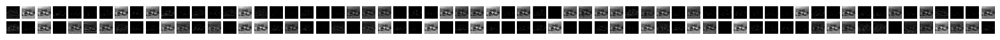

1/1 [==============================] - 0s 145ms/step


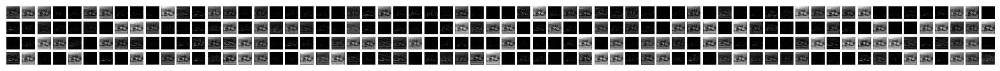

1/1 [==============================] - 0s 171ms/step


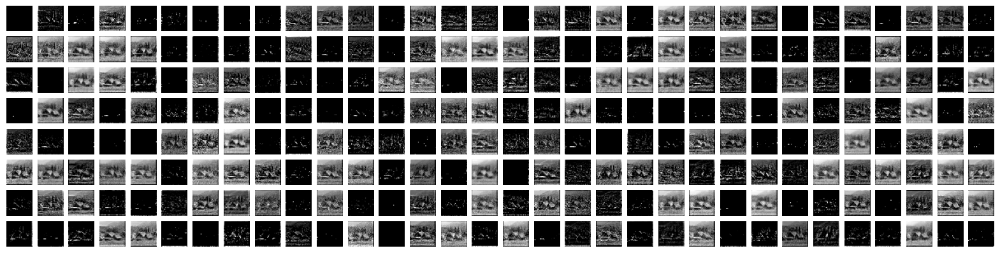

1/1 [==============================] - 0s 198ms/step


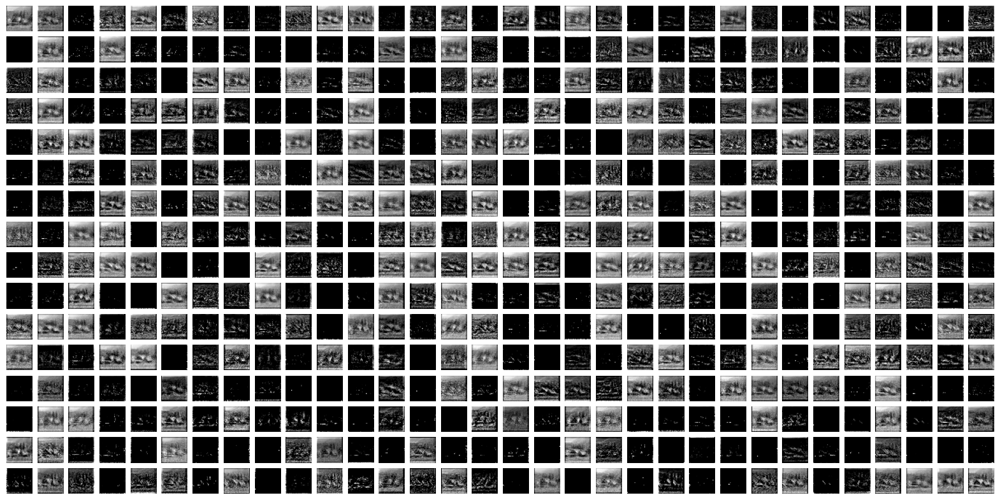

1/1 [==============================] - 0s 237ms/step


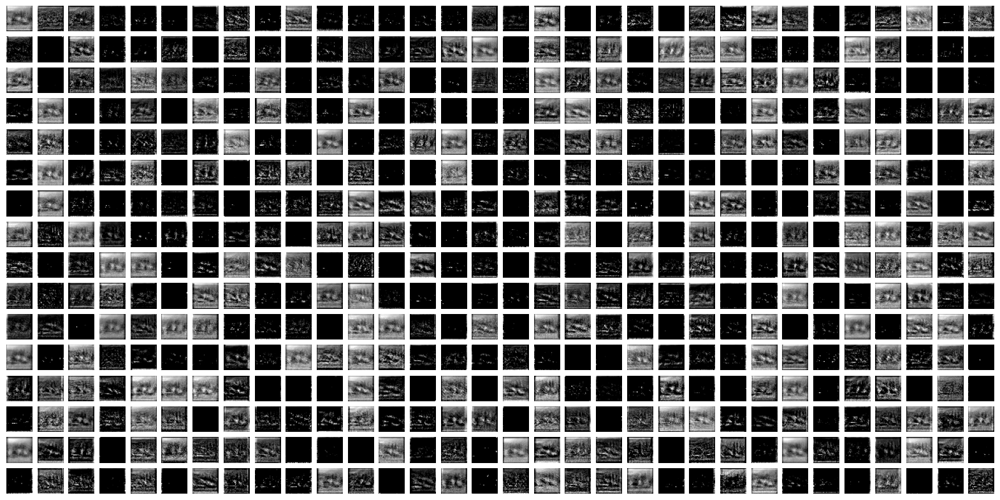

1/1 [==============================] - 0s 294ms/step


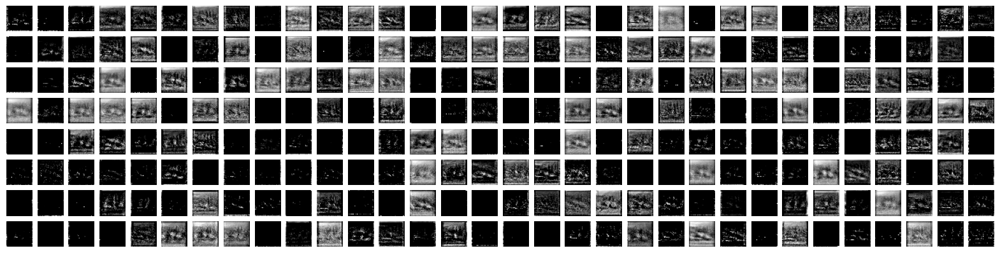

1/1 [==============================] - 0s 278ms/step


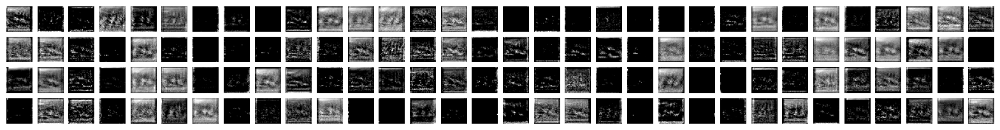

1/1 [==============================] - 0s 298ms/step


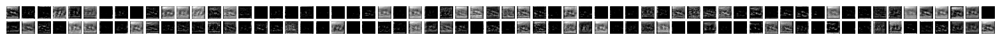

1/1 [==============================] - 0s 292ms/step


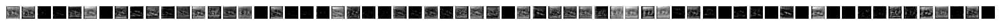

1/1 [==============================] - 0s 353ms/step


1/1 [==============================] - 0s 336ms/step


1/1 [==============================] - 0s 373ms/step


1/1 [==============================] - 0s 381ms/step


1/1 [==============================] - 0s 371ms/step


In [23]:
from keras.models import Model
import matplotlib.pyplot as plt
import numpy as np

input_image = sample_image

layer_outputs = [layer.output for layer in model.layers]
feature_map_models = [Model(inputs=model.inputs, outputs=output) for output in layer_outputs]

for feature_map_model in feature_map_models:
    feature_map = feature_map_model.predict(input_image)
    
    n_features = feature_map.shape[-1]  
    size = feature_map.shape[1]  
    plt.figure(figsize=(20, 20))
    for i in range(1, n_features + 1):
        plt.subplot(size, size, i)
        plt.imshow(feature_map[0, :, :, i - 1], cmap='gray')
        plt.axis('off')

    plt.show()


[]

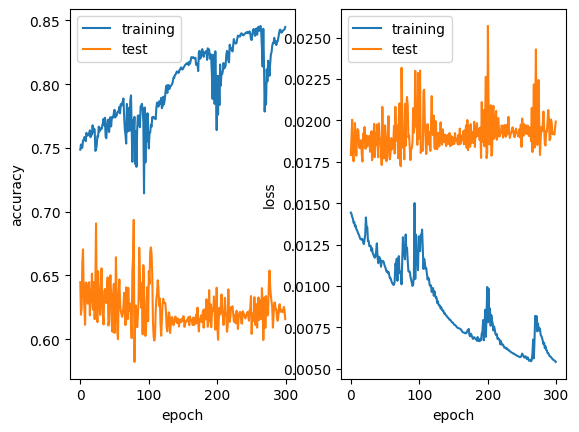

In [24]:
plt.subplot(121)
plt.plot(history.history['accuracy'],label='training')
plt.plot(history.history['val_accuracy'],label = 'test')
plt.legend()
plt.xlabel("epoch")
plt.ylabel("accuracy")
plt.subplot(122)
plt.plot(history.history['loss'],label='training')
plt.plot(history.history['val_loss'],label = 'test')
plt.legend()
plt.xlabel("epoch")
plt.ylabel("loss")
plt.plot()

1/1 [==============================] - 0s 59ms/step


C:\Users\win10\AppData\Local\Temp\ipykernel_5996\1876879985.py:56: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 10 negative Z values that have been clipped to zero
  axarr[1].imshow(lab2rgb(result))


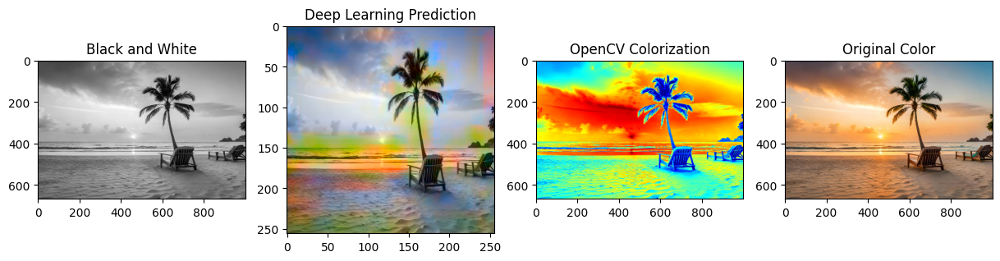

1/1 [==============================] - 0s 59ms/step


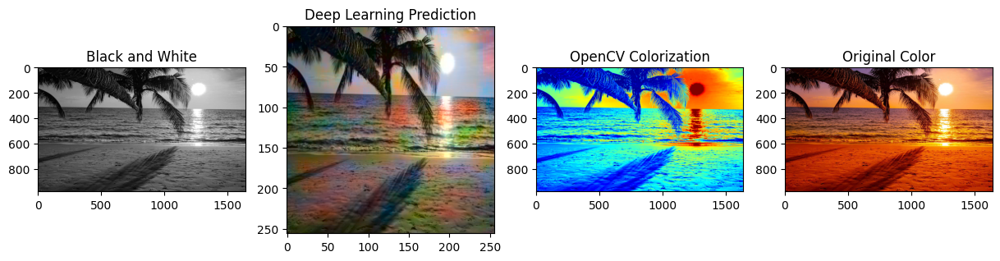

1/1 [==============================] - 0s 68ms/step


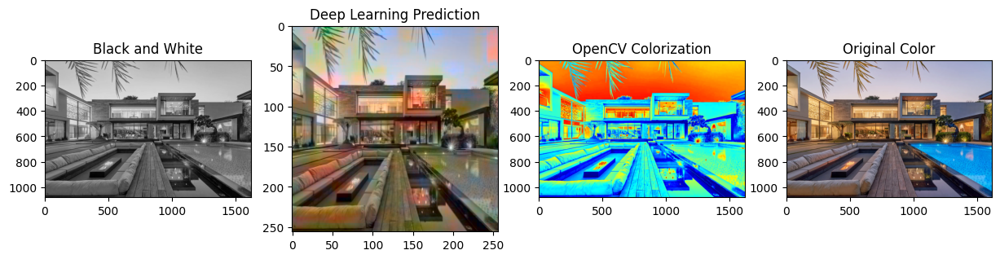

1/1 [==============================] - 0s 73ms/step


C:\Users\win10\AppData\Local\Temp\ipykernel_5996\1876879985.py:56: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 72 negative Z values that have been clipped to zero
  axarr[1].imshow(lab2rgb(result))


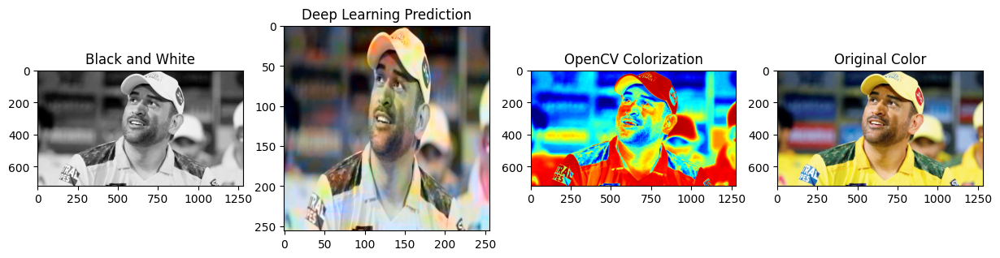

1/1 [==============================] - 0s 60ms/step


C:\Users\win10\AppData\Local\Temp\ipykernel_5996\1876879985.py:56: UserWarning: Conversion from CIE-LAB, via XYZ to sRGB color space resulted in 4 negative Z values that have been clipped to zero
  axarr[1].imshow(lab2rgb(result))


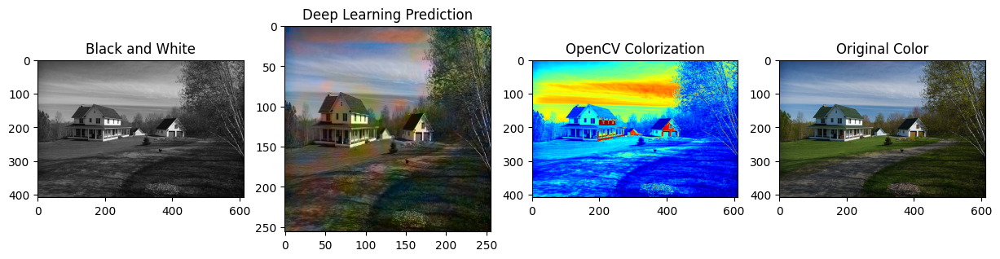

In [25]:
from PIL import Image
import os
import numpy as np
import cv2
from tensorflow.keras.preprocessing.image import img_to_array
from skimage.color import rgb2lab, lab2rgb
from skimage.transform import resize
import matplotlib.pyplot as plt

# Paths to your 'gray' and 'rgb' folders
gray_images_path = 'ne_images/ne_images/gray/'
rgb_images_path = 'ne_images/ne_images/rgb/'

# List all files in the 'gray' folder
gray_image_files = os.listdir(gray_images_path)

for file_name in gray_image_files:
    if file_name.endswith(('.jpg', '.jpeg', '.png')):  # Check for image files
        gray_file_path = os.path.join(gray_images_path, file_name)
        rgb_file_path = os.path.join(rgb_images_path, file_name)

        # Load the grayscale image and convert it for the model
        img_gray = Image.open(gray_file_path).convert('RGB')
        img1_color = []
        img1 = img_to_array(img_gray)
        img1 = resize(img1, (256, 256))
        img1_color.append(img1)

        img1_color = np.array(img1_color, dtype=float)
        img1_color = rgb2lab(1.0 / 255 * img1_color)[:, :, :, 0]
        img1_color = img1_color.reshape(img1_color.shape + (1,))

        # Predict the colorization with the deep learning model
        output1 = model1.predict(img1_color)
        output1 = output1 * 128

        # Construct the colorized image from the model
        result = np.zeros((256, 256, 3))
        result[:, :, 0] = img1_color[0][:, :, 0]
        result[:, :, 1:] = output1[0]

        # Load the original color image
        img_original = Image.open(rgb_file_path)

        # Colorization with OpenCV using colormap
        img_gray_cv = cv2.imread(gray_file_path, cv2.IMREAD_GRAYSCALE)
        colorized_img_opencv = cv2.applyColorMap(img_gray_cv, cv2.COLORMAP_JET)

        # Display the grayscale, model prediction, OpenCV colorization, and original images
        f, axarr = plt.subplots(1, 4, figsize=(15, 5))
        axarr[0].title.set_text('Black and White')
        axarr[1].title.set_text('Deep Learning Prediction')
        axarr[2].title.set_text('OpenCV Colorization')
        axarr[3].title.set_text('Original Color')
        axarr[0].imshow(img_gray.convert('L'), cmap='gray')
        axarr[1].imshow(lab2rgb(result))
        axarr[2].imshow(cv2.cvtColor(colorized_img_opencv, cv2.COLOR_BGR2RGB))
        axarr[3].imshow(img_original)
        plt.show()


In [28]:
score=model2.evaluate(X,Y,verbose=0)
print('loss',score[0])
print('accuracy',score[1])

loss 0.008596505038440228
accuracy 0.7947721481323242


In [29]:
score=model3.evaluate(X,Y,verbose=0)
print('loss',score[0])
print('accuracy',score[1])

loss 0.25142306089401245
accuracy 0.4636526107788086
